# Moodify - Spotify Songs Clustering 

In [ ]:
!pip install kneed
!pip install spotipy

In [ ]:
# Library Imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage
from yellowbrick.cluster import silhouette_visualizer, SilhouetteVisualizer
from sklearn.metrics import silhouette_score
import plotly.express as px
import matplotlib.cm as cm
from matplotlib.colors import colorConverter
from kneed import KneeLocator
from scipy.spatial import distance
from random import sample
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
%matplotlib inline

In [ ]:
pd.set_option("display.max_rows", None, "display.max_columns",None)

In [ ]:
#Importing data
df = pd.read_csv("spotify_songs.csv")
df.head()

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,playlist_subgenre,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,6f807x0ima9a1j3VPbc7VN,I Don't Care (with Justin Bieber) - Loud Luxur...,Ed Sheeran,66,2oCs0DGTsRO98Gh5ZSl2Cx,I Don't Care (with Justin Bieber) [Loud Luxury...,2019-06-14,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.748,0.916,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036,194754
1,0r7CVbZTWZgbTCYdfa2P31,Memories - Dillon Francis Remix,Maroon 5,67,63rPSO264uRjW1X5E6cWv6,Memories (Dillon Francis Remix),2019-12-13,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.726,0.815,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972,162600
2,1z1Hg7Vb0AhHDiEmnDE79l,All the Time - Don Diablo Remix,Zara Larsson,70,1HoSmj2eLcsrR0vE9gThr4,All the Time (Don Diablo Remix),2019-07-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.675,0.931,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008,176616
3,75FpbthrwQmzHlBJLuGdC7,Call You Mine - Keanu Silva Remix,The Chainsmokers,60,1nqYsOef1yKKuGOVchbsk6,Call You Mine - The Remixes,2019-07-19,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.718,0.930,7,-3.778,1,0.1020,0.0287,0.000009,0.2040,0.277,121.956,169093
4,1e8PAfcKUYoKkxPhrHqw4x,Someone You Loved - Future Humans Remix,Lewis Capaldi,69,7m7vv9wlQ4i0LFuJiE2zsQ,Someone You Loved (Future Humans Remix),2019-03-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.650,0.833,1,-4.672,1,0.0359,0.0803,0.000000,0.0833,0.725,123.976,189052


# Exploratory Data Analysis

In [ ]:
# Check info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32833 entries, 0 to 32832
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   track_id                  32833 non-null  object 
 1   track_name                32828 non-null  object 
 2   track_artist              32828 non-null  object 
 3   track_popularity          32833 non-null  int64  
 4   track_album_id            32833 non-null  object 
 5   track_album_name          32828 non-null  object 
 6   track_album_release_date  32833 non-null  object 
 7   playlist_name             32833 non-null  object 
 8   playlist_id               32833 non-null  object 
 9   playlist_genre            32833 non-null  object 
 10  playlist_subgenre         32833 non-null  object 
 11  danceability              32833 non-null  float64
 12  energy                    32833 non-null  float64
 13  key                       32833 non-null  int64  
 14  loudne

In [ ]:
# Unique number of artists
df['track_artist'].nunique()

10692

In [ ]:
# Number of albums
df['track_album_name'].nunique()

19743

In [ ]:
# Oldest track release date
min(df['track_album_release_date'])

'1957-01-01'

In [ ]:
# Latest track release date
max(df['track_album_release_date'])

'2020-01-29'

In [ ]:
# Number of tracks per artist/ Top 10 artist according to track count
df.groupby('track_artist',as_index=False).size().sort_values(by='size',ascending=False).head(10)

,track_artist,size
6098,Martin Garrix,161
7576,Queen,136
9215,The Chainsmokers,123
2333,David Guetta,110
2598,Don Omar,102
2641,Drake,100
2520,Dimitri Vegas & Like Mike,93
1501,Calvin Harris,91
3804,Hardwell,84
5170,Kygo,83


## Number of tracks per artist

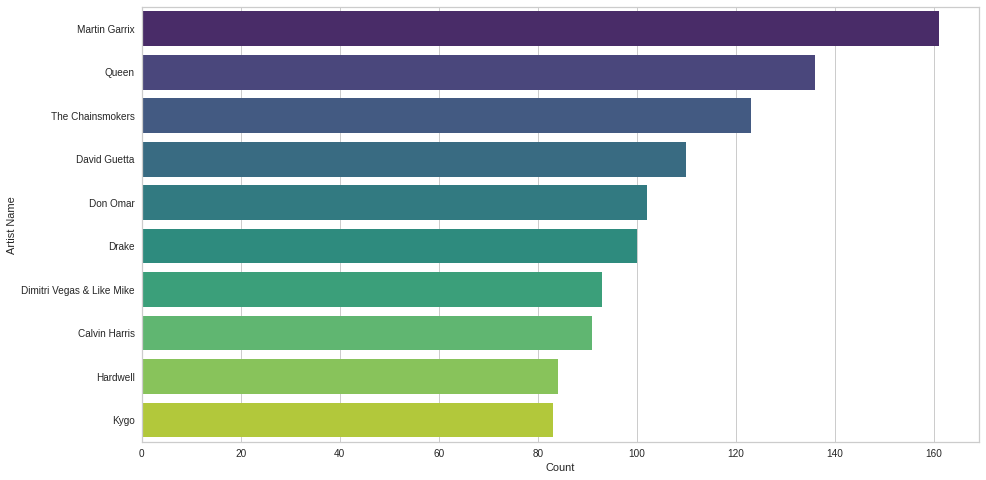

In [ ]:
#Bar chart for top 10 artists
artist=df.groupby('track_artist',as_index=False).size().sort_values(by='size',ascending=False).head(10)['track_artist']
size=df.groupby('track_artist',as_index=False).size().sort_values(by='size',ascending=False).head(10)['size']
plt.figure(figsize=(15,8))
sns.barplot(y=artist,x=size,palette ='viridis')
plt.xlabel('Count')
plt.ylabel('Artist Name')
plt.show()

## Distribution of track popularity

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 0, 'Track Popularity')

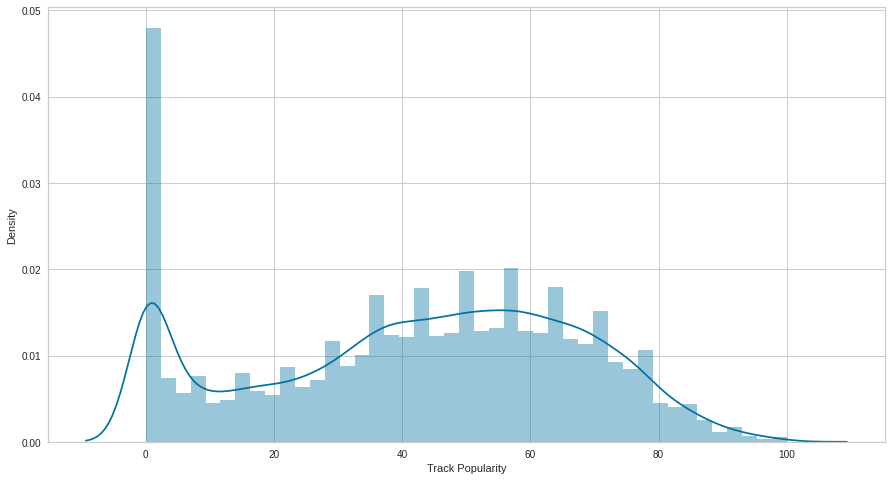

In [ ]:
#Distribution of track popularity
plt.figure(figsize=(15,8))
sns.distplot(df['track_popularity'])
plt.xlabel("Track Popularity")

## Playlist genre bar chart

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0, 0.5, 'Count')

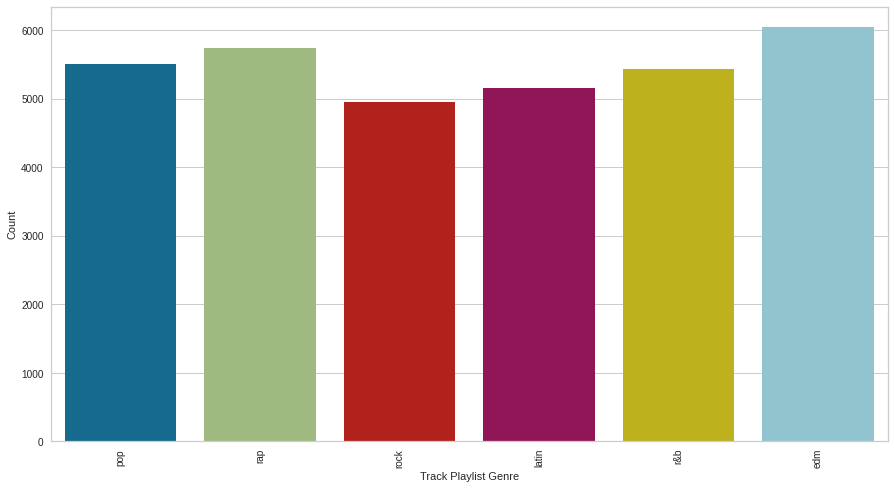

In [ ]:
# Playlist genre bar chart
plt.figure(figsize=(15,8))
sns.countplot(df["playlist_genre"])
plt.xticks(rotation = 90)
plt.xlabel("Track Playlist Genre")
plt.ylabel("Count")

## Playlist subgenre bar chart


In [ ]:
df["playlist_subgenre"].value_counts()

progressive electro house    1809
southern hip hop             1675
indie poptimism              1672
latin hip hop                1656
neo soul                     1637
pop edm                      1517
electro house                1511
hard rock                    1485
gangster rap                 1458
electropop                   1408
urban contemporary           1405
hip hop                      1322
dance pop                    1298
classic rock                 1296
trap                         1291
tropical                     1288
latin pop                    1262
hip pop                      1256
big room                     1206
new jack swing               1133
post-teen pop                1129
permanent wave               1105
album rock                   1065
reggaeton                     949
Name: playlist_subgenre, dtype: int64

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0, 0.5, 'Count')

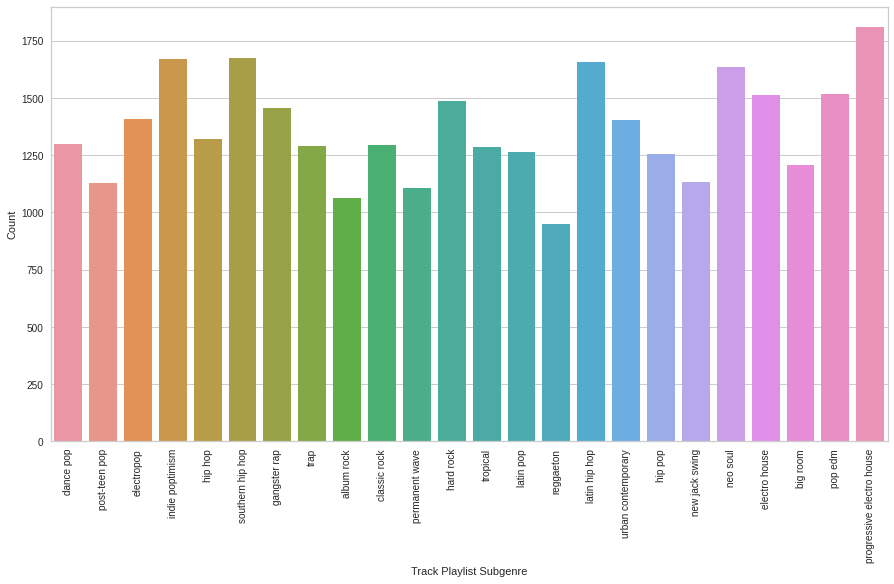

In [ ]:
# Playlist subgenre bar chart
plt.figure(figsize=(15,8))
sns.countplot(df["playlist_subgenre"])
plt.xticks(rotation = 90)
plt.xlabel("Track Playlist Subgenre")
plt.ylabel("Count")

In [ ]:
len(df["track_artist"].unique()),df["track_artist"].unique()[:15], df["playlist_name"].unique()[:15]

(10693, array(['Ed Sheeran', 'Maroon 5', 'Zara Larsson', 'The Chainsmokers',
        'Lewis Capaldi', 'Katy Perry', 'Sam Feldt', 'Avicii',
        'Shawn Mendes', 'Ellie Goulding', 'Loud Luxury', 'Martin Garrix',
        'AJ Mitchell', 'David Guetta', 'Sam Smith'], dtype=object), array(['Pop Remix', 'Dance Pop', 'Dance Room', 'Cardio', 'Dance Pop Hits',
        'Pop Warmup 130 BPM', 'Dance Pop: Japan', 'K-Party Dance Mix',
        'Dance Pop Tunes', 'Pop / Dance', 'Todo Éxitos', '90s Dance Hits',
        'Christian Dance Party', 'Pop Dance Hits',
        'Best of 2019 Dance Pop: Japan'], dtype=object))

## Feature Statistics

In [ ]:
# Feature Statistics
df.describe()

,track_popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
count,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000
mean,42.477081,0.654850,0.698619,5.374471,-6.719499,0.565711,0.107068,0.175334,0.084747,0.190176,0.510561,120.881132,225799.811622
std,24.984074,0.145085,0.180910,3.611657,2.988436,0.495671,0.101314,0.219633,0.224230,0.154317,0.233146,26.903624,59834.006182
min,0.000000,0.000000,0.000175,0.000000,-46.448000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4000.000000
25%,24.000000,0.563000,0.581000,2.000000,-8.171000,0.000000,0.041000,0.015100,0.000000,0.092700,0.331000,99.960000,187819.000000
50%,45.000000,0.672000,0.721000,6.000000,-6.166000,1.000000,0.062500,0.080400,0.000016,0.127000,0.512000,121.984000,216000.000000
75%,62.000000,0.761000,0.840000,9.000000,-4.645000,1.000000,0.132000,0.255000,0.004830,0.248000,0.693000,133.918000,253585.000000
max,100.000000,0.983000,1.000000,11.000000,1.275000,1.000000,0.918000,0.994000,0.994000,0.996000,0.991000,239.440000,517810.000000


## Audio Features

In [ ]:
# Selected audio features
audio_features = ['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']

In [ ]:
# Subsetting the audio features
tracks_df = df[audio_features]
tracks_df.head()     

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
0,0.748,0.916,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036
1,0.726,0.815,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972
2,0.675,0.931,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008
3,0.718,0.930,7,-3.778,1,0.1020,0.0287,0.000009,0.2040,0.277,121.956
4,0.650,0.833,1,-4.672,1,0.0359,0.0803,0.000000,0.0833,0.725,123.976


## Boxplot of audio features

Text(0.5, 0, 'Audio Features')

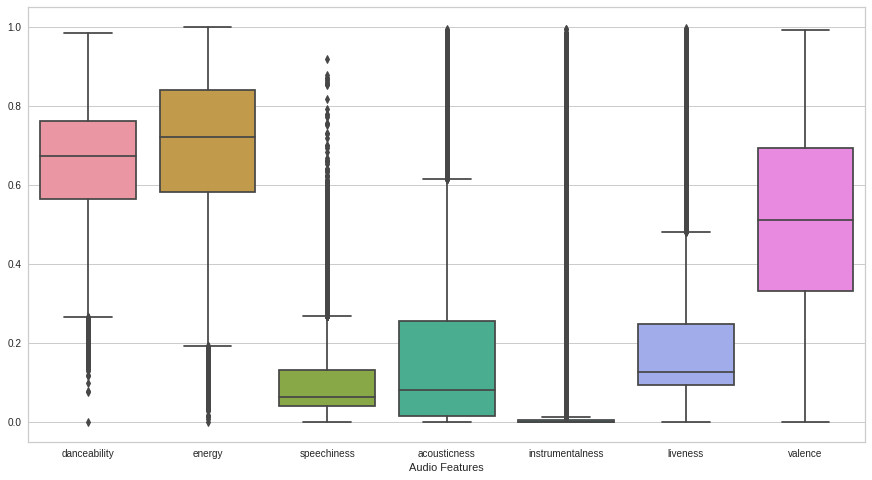

In [ ]:
# Boxplot of audio features
plt.figure(figsize=(15,8))
sns.boxplot(data = tracks_df.drop(["tempo","loudness", "key", "mode"], axis = 1))
plt.xlabel("Audio Features")


## Audio Features Distributions

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

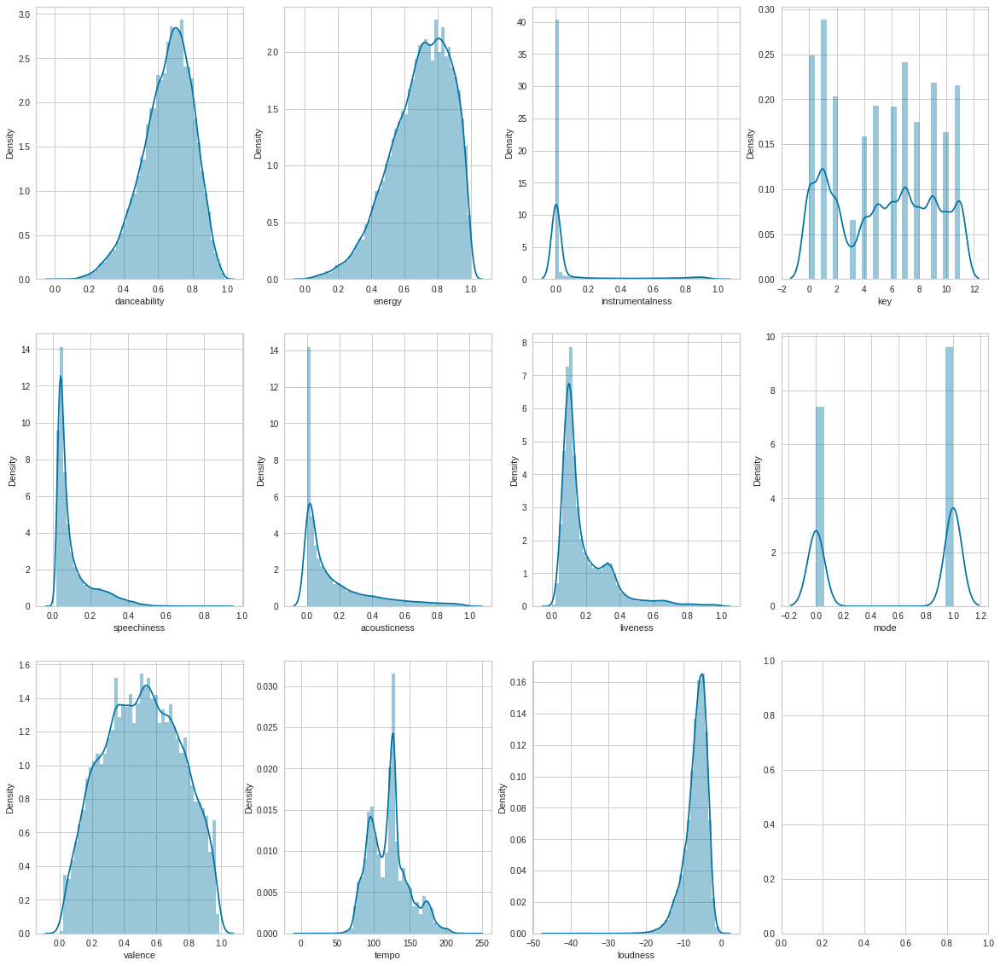

In [ ]:
# Distributions of audio features
fig, ax = plt.subplots(3,4,figsize = (20,20))
sns.distplot(tracks_df["danceability"], ax=ax[0,0])
sns.distplot(tracks_df["energy"], ax=ax[0,1], kde = True);
sns.distplot(tracks_df["speechiness"], ax=ax[1,0], kde = True);
sns.distplot(tracks_df["acousticness"], ax=ax[1,1], kde = True);
sns.distplot(tracks_df["instrumentalness"], ax=ax[0,2], kde = True);
sns.distplot(tracks_df["liveness"], ax=ax[1,2], kde = True);
sns.distplot(tracks_df["valence"], ax=ax[2,0], kde = True);
sns.distplot(tracks_df["tempo"], ax=ax[2,1], kde = True);
sns.distplot(tracks_df["loudness"], ax=ax[2,2], kde = True);
sns.distplot(tracks_df["key"], ax=ax[0,3], kde = True);
sns.distplot(tracks_df["mode"], ax=ax[1,3], kde = True);

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

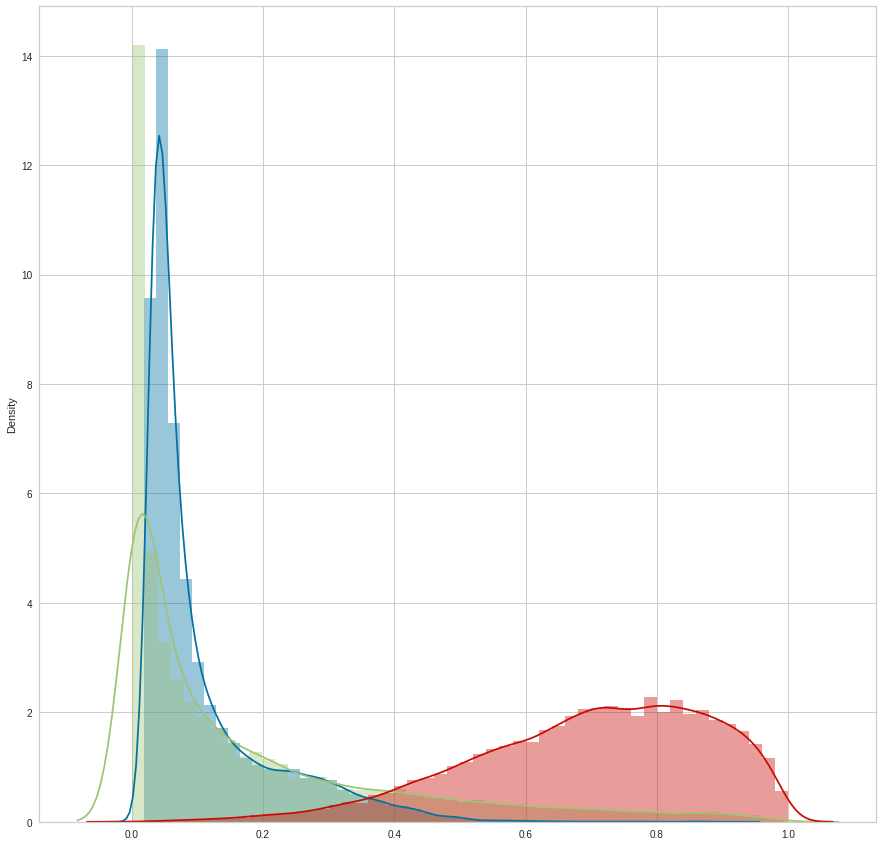

In [ ]:
plt.figure(figsize=(15,15))
selected_cols = ["speechiness","acousticness","energy"]
for col in tracks_df[selected_cols].columns:
  sns.distplot(tracks_df[[col]])

## Audio Features Correlation Heatmap

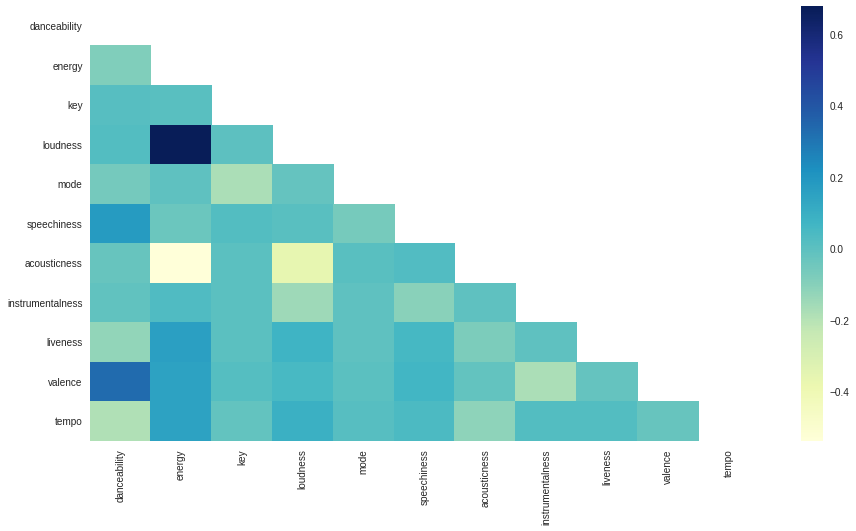

In [ ]:
# Correlation Heatmap 
plt.figure(figsize=(15,8))
# creating mask
mask = np.triu(np.ones_like(tracks_df.corr()))
 
# plotting a triangle correlation heatmap
dataplot = sns.heatmap(tracks_df.corr(), cmap="YlGnBu",  mask=mask)
 
# displaying heatmap
plt.show()

# Data Pre-processing and K-Means Clustering Pipeline


In [ ]:
X = tracks_df

## Elbow method with Min Max Scaler

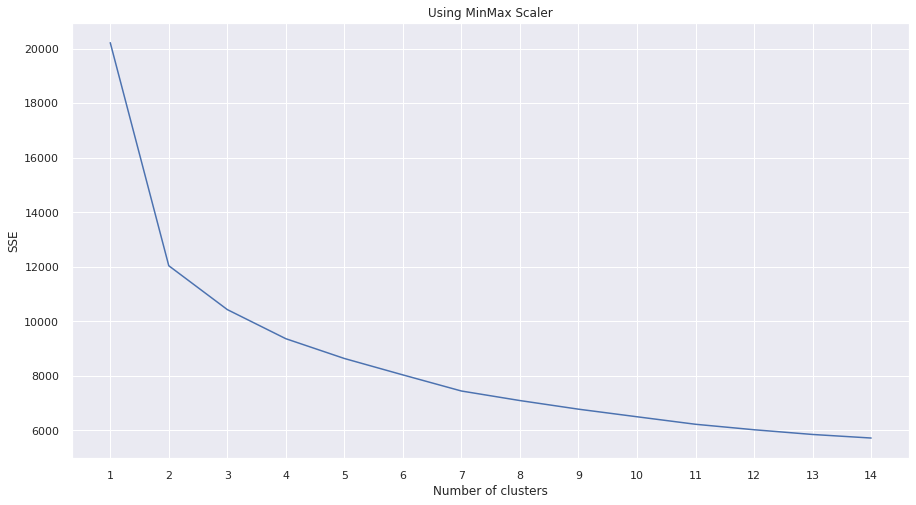

In [ ]:
kwargs = {
         'init': 'k-means++',
         'n_init': 30,
         'max_iter': 500,
         'random_state': 100
 }
sse = []
max_k = 15

for k in range(1,max_k):
  pipeline = Pipeline([
                      ('scaler', MinMaxScaler()),
                      ('kmeans', KMeans(n_clusters=k, **kwargs))
  ])  
  pipeline.fit(X)
  sse.append(pipeline['kmeans'].inertia_)

sns.set_theme()
plt.figure(figsize = (15,8))
p = sns.lineplot(x = range(1,max_k), y = sse)
plt.xticks(range(1, max_k));
p.set(xlabel='Number of clusters',
       ylabel = 'SSE',
      title = 'Using MinMax Scaler');

## Elbow method with Standard Scaler

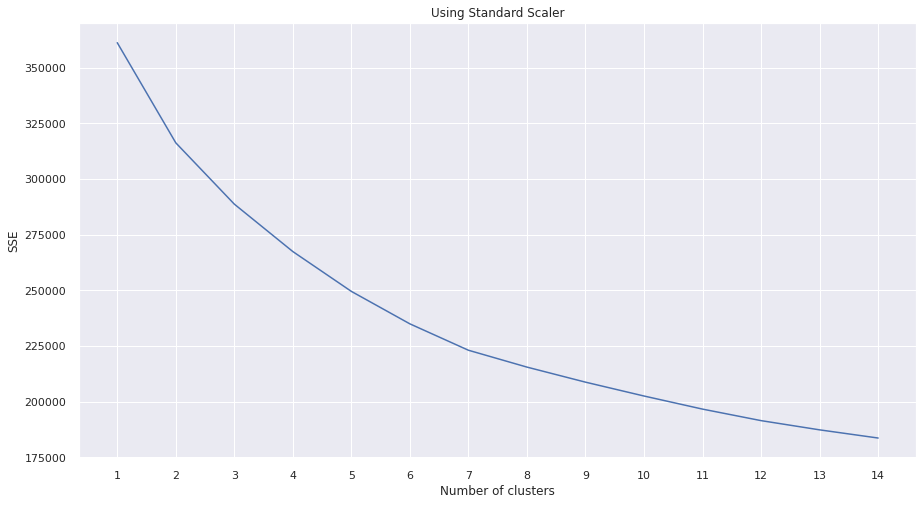

In [ ]:
kwargs = {
         'init': 'k-means++',
         'n_init': 30,
         'max_iter': 500,
         'random_state': 100
 }
sse = []
max_k = 15

for k in range(1,max_k):
  pipeline = Pipeline([
                      ('scaler', StandardScaler()),
                      ('kmeans', KMeans(n_clusters=k, **kwargs))
  ])  
  pipeline.fit(X)
  sse.append(pipeline['kmeans'].inertia_)

sns.set_theme()
plt.figure(figsize = (15,8))
p = sns.lineplot(x = range(1,max_k), y = sse)
plt.xticks(range(1, max_k));
p.set(xlabel='Number of clusters',
       ylabel = 'SSE',
      title = 'Using Standard Scaler');

6

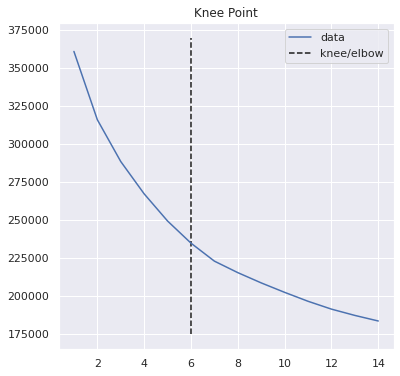

In [ ]:
kl = KneeLocator(x = range(1,max_k), y = sse, curve = "convex", direction="decreasing")
kl.plot_knee()
kl.elbow

In [ ]:
km = pipeline['kmeans']
scaler = pipeline['scaler']
X_transformed = scaler.transform(X)
sil_score = silhouette_score(X_transformed, km.labels_, metric='euclidean')

print("Silhouette score: ",sil_score)
#silhouette_visualizer(km, X_transformed, colors='yellowbrick')



Silhouette score:  0.10833801361269023


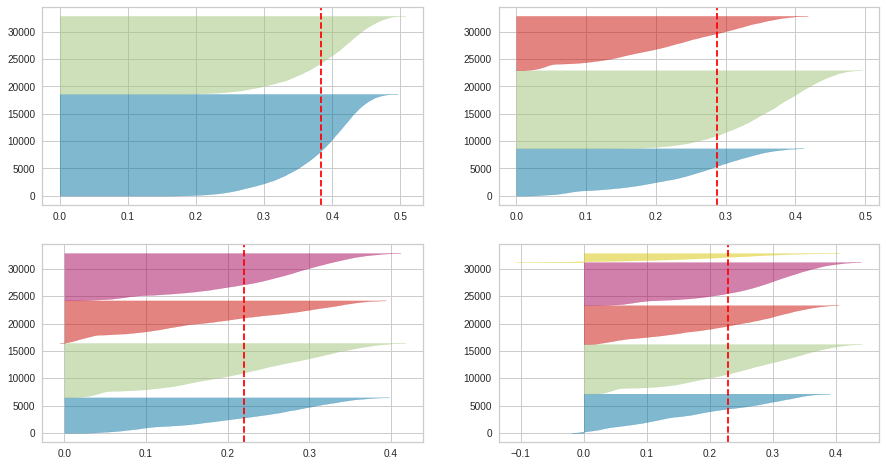

In [ ]:
fig, ax = plt.subplots(2, 2, figsize=(15,8))
for i in [2,3, 4, 5]:
    '''
    Create KMeans instance for different number of clusters
    '''
    km = KMeans(n_clusters=i, **kwargs)
    q, mod = divmod(i, 2)
    '''
    Create SilhouetteVisualizer instance with KMeans instance
    Fit the visualizer
    '''
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(X_transformed)


# PCA for Visualisation and K determination Intuition

In [ ]:
X = tracks_df
scaler = MinMaxScaler()
X_transformed = scaler.fit_transform(X)

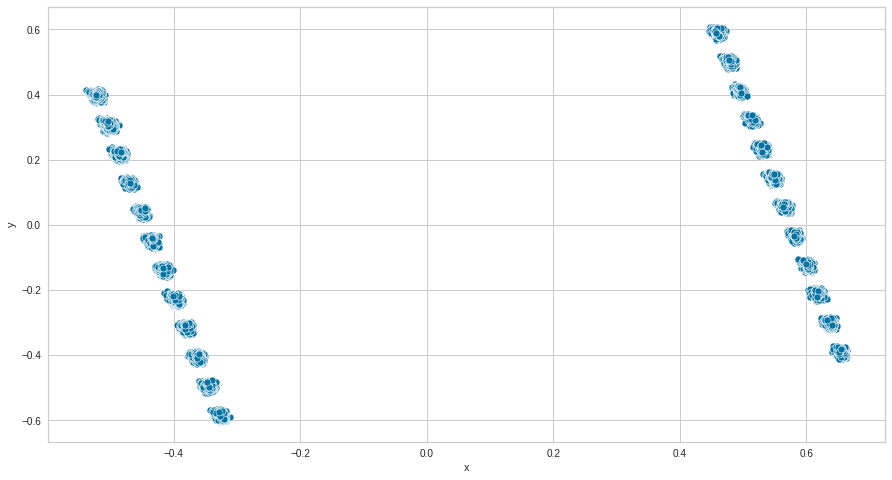

In [ ]:
pca = PCA(n_components=2)
principal_components = pca.fit_transform(X_transformed)
pca_df = pd.DataFrame(principal_components)
#pca_df['mood_labels'] = km.labels_
pca_df.columns = ['x', 'y']

plt.figure(figsize = (15,8))
sns.scatterplot(data = pca_df, x = "x", y = "y",
                 palette=sns.color_palette("Set2",4));

In [ ]:
print(pca.explained_variance_ratio_ , sum(pca.explained_variance_ratio_))

[0.40830269 0.16607585] 0.5743785427263226


Select K = 24 based on PCA scatter plot

In [ ]:
pca = PCA(n_components=3)
principal_components = pca.fit_transform(X_transformed)
pca_df = pd.DataFrame(principal_components)
pca_df['mood_labels'] = hc.labels_
pca_df.columns = ['x', 'y','z','mood_labels']
pca_df

,x,y,z,mood_labels
0,-0.413261,-0.141511,-0.185544,0
1,-0.325139,-0.592796,-0.251566,0
2,0.478571,0.494520,-0.260242,1
3,-0.395191,-0.221966,-0.100105,0
4,-0.503540,0.297817,-0.270936,0
...,...,...,...,...
32828,-0.489583,0.226497,0.000221,0
32829,-0.523132,0.399341,-0.116105,0
32830,0.562598,0.056241,-0.061147,1
32831,-0.484183,0.223255,-0.086185,0


In [ ]:
print(pca.explained_variance_ratio_ , sum(pca.explained_variance_ratio_))

[0.40830269 0.16607585 0.11138223] 0.6857607719225232


In [ ]:
px.scatter_3d(pca_df, x='x', y='y', z='z',
              color='mood_labels')

In [ ]:
kwargs = {
        'init': 'k-means++',
        'n_init': 30,
        'max_iter': 500,
        'random_state': 100
}


In [ ]:
#fit pipeline with optimal k
k = 4
pipeline_k_4 = Pipeline([
                      ('scaler', MinMaxScaler()),
                      ('kmeans', KMeans(n_clusters=k, **kwargs))
  ])  
pipeline_k_4.fit(X)



Pipeline(steps=[('scaler', MinMaxScaler()),
                ('kmeans',
                 KMeans(max_iter=500, n_clusters=4, n_init=30,
                        random_state=100))])

In [ ]:
#fit pipeline with optimal k from PCA
k = 24
pipeline = Pipeline([
                     ('scaler', MinMaxScaler()),
                     ('kmeans', KMeans(n_clusters=k, **kwargs))
  ])  
pipeline.fit(X)



Pipeline(steps=[('scaler', MinMaxScaler()),
                ('kmeans',
                 KMeans(max_iter=500, n_clusters=24, n_init=30,
                        random_state=100))])

In [ ]:
import colorcet as cc

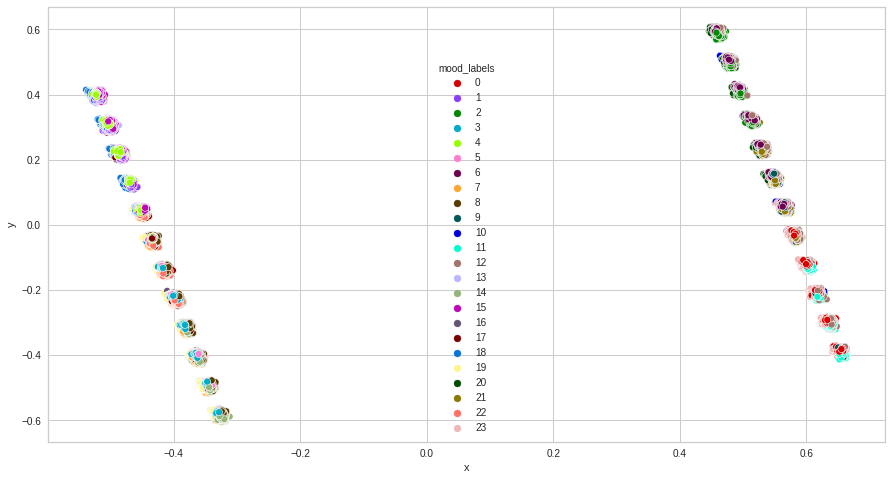

In [ ]:
km = pipeline['kmeans']
scaler = pipeline['scaler']
X_transformed = scaler.transform(X)

pca_df['mood_labels'] = km.labels_
plt.figure(figsize = (15,8))
sns.scatterplot(data = pca_df, x = "x", y = "y", hue = "mood_labels",
                 palette=sns.color_palette(cc.glasbey, n_colors=24));

## Hierarchical Clustering

In [ ]:
#Hierarchical clustering with k=4
pipeline_h_4 = Pipeline([
                     ('scaler', MinMaxScaler()),
                     ('hierarchical', AgglomerativeClustering(linkage = 'average',n_clusters = 4))
])  
pipeline_h_4.fit(X)


Pipeline(steps=[('scaler', MinMaxScaler()),
                ('hierarchical',
                 AgglomerativeClustering(linkage='average', n_clusters=4))])

In [ ]:
#Hierarchical clustering with k=24
pipeline_h_24 = Pipeline([
                     ('scaler', MinMaxScaler()),
                     ('hierarchical', AgglomerativeClustering(linkage = 'average',n_clusters = 24))
])  
pipeline_h_24.fit(X)

Pipeline(steps=[('scaler', MinMaxScaler()),
                ('hierarchical',
                 AgglomerativeClustering(linkage='average', n_clusters=24))])

In [ ]:
def plot_dendrogram(model, **kwargs):
    children = model.children_
    dist = np.arange(children.shape[0])+1
    n_obs = np.arange(2, children.shape[0]+2)
    linkage_matrix = np.column_stack([children, dist, n_obs])
    dendrogram(linkage_matrix.astype(float), **kwargs)

model = pipeline['hierarchical']
figure = plt.figure(figsize=(20, 25))
plt.title("Hierarchical Clustering Dendrogram", fontsize=18)
plot_dendrogram(model, orientation='right', leaf_font_size=9)
plt.show()

In [ ]:
hc = pipeline['hierarchical']
scaler = pipeline['scaler']
X_transformed = scaler.transform(X)
sil_score = silhouette_score(X_transformed, hc.labels_, metric='euclidean')

print("Silhouette score: ",sil_score)
#silhouette_visualizer(hc, X_transformed, colors='yellowbrick')

#ward : 0.38
#complete : 0.38

Silhouette score:  0.38343169588983084


In [ ]:
def silhouette_plot(X, y, n_clusters, ax=None):
    from sklearn.metrics import silhouette_samples, silhouette_score

    if ax is None:
        ax = plt.gca()

    # Compute the silhouette scores for each sample
    silhouette_avg = silhouette_score(X, y)
    sample_silhouette_values = silhouette_samples(X, y)

    y_lower = padding = 2
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        ith_cluster_silhouette_values = sample_silhouette_values[y == i]
        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        cmap = cm.get_cmap("Spectral")
        color = cmap(float(i) / n_clusters)
        #color = cm.spectral(float(i) / n_clusters)
        ax.fill_betweenx(np.arange(y_lower, y_upper),
                         0,
                         ith_cluster_silhouette_values,
                         facecolor=color,
                         edgecolor=color,
                         alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i + 1))

        # Compute the new y_lower for next plot
        y_lower = y_upper + padding

    ax.set_xlabel("The silhouette coefficient values")
    ax.set_ylabel("Cluster label")

    # The vertical line for average silhoutte score of all the values
    ax.axvline(x=silhouette_avg, c='r', alpha=0.8, lw=0.8, ls='-')
    ax.annotate('Average',
                xytext=(silhouette_avg, y_lower * 1.025),
                xy=(0, 0),
                ha='center',
                alpha=0.8,
                c='r')

    ax.set_yticks([])  # Clear the yaxis labels / ticks
    ax.set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])
    ax.set_ylim(0, y_upper + 1)
    ax.set_xlim(-0.075, 1.0)
    return ax

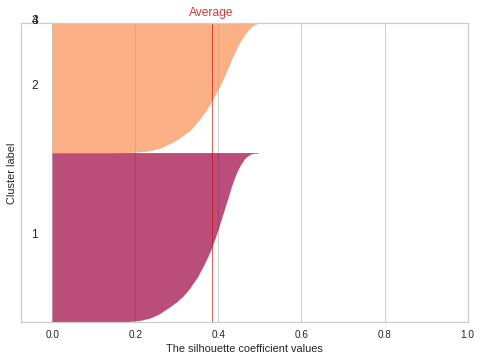

In [ ]:
hc = pipeline['hierarchical']
scaler = pipeline['scaler']
X_transformed = scaler.transform(X)

silhouette_plot(X_transformed, hc.labels_, 4)

#Kmeans Vc Hierarchical


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0.5, 1.0, 'Cluster distribution with Kmeans (K=4)')

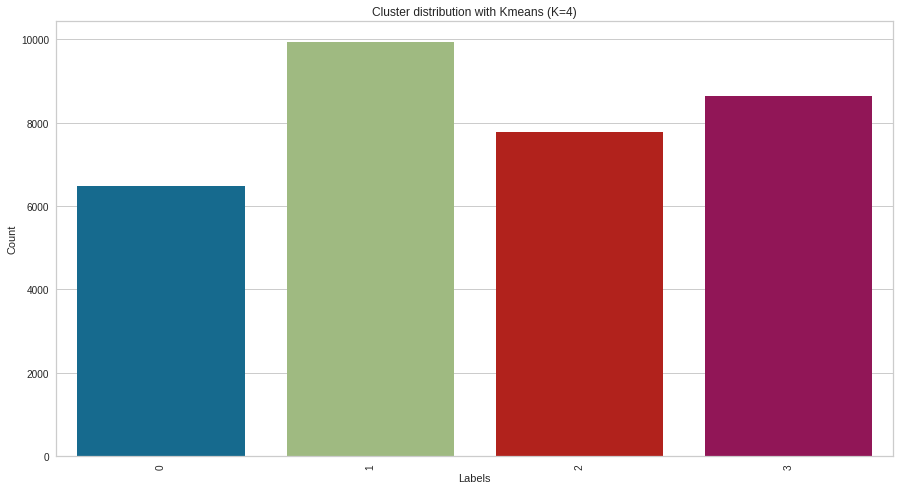

In [ ]:
# barchart for kmeans with k=4
test=df.copy()
test['Labels']=pipeline_k_4.predict(df[audio_features])
plt.figure(figsize=(15,8))
sns.countplot(test["Labels"])
plt.xticks(rotation = 90)
plt.xlabel("Labels")
plt.ylabel("Count")
plt.title("Cluster distribution with Kmeans (K=4)")

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0.5, 1.0, 'Cluster distribution with Kmeans (K=24)')

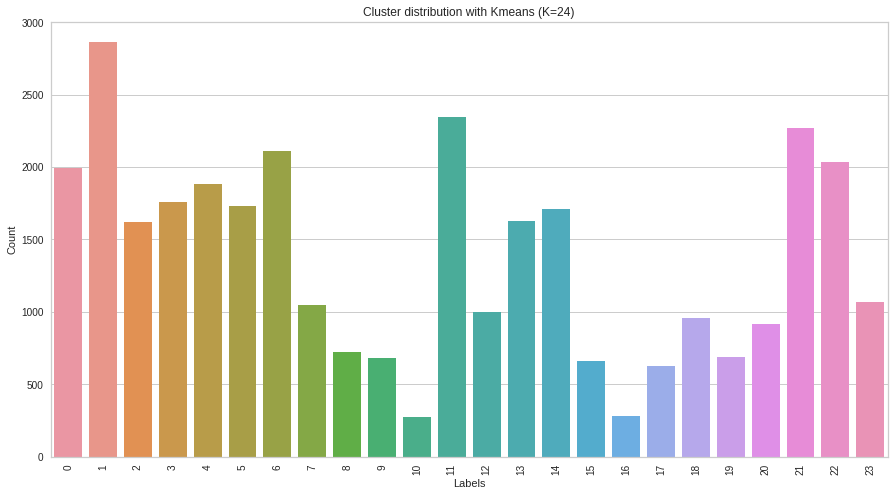

In [ ]:
# barchart for kmeans with k=24
test=df.copy()
test['Labels']=pipeline_k_24.predict(df[audio_features])
plt.figure(figsize=(15,8))
sns.countplot(test["Labels"])
plt.xticks(rotation = 90)
plt.xlabel("Labels")
plt.ylabel("Count")
plt.title("Cluster distribution with Kmeans (K=24)")

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0.5, 1.0, 'Cluster distribution with Hierarchical (K=4,Linkage = Average)')

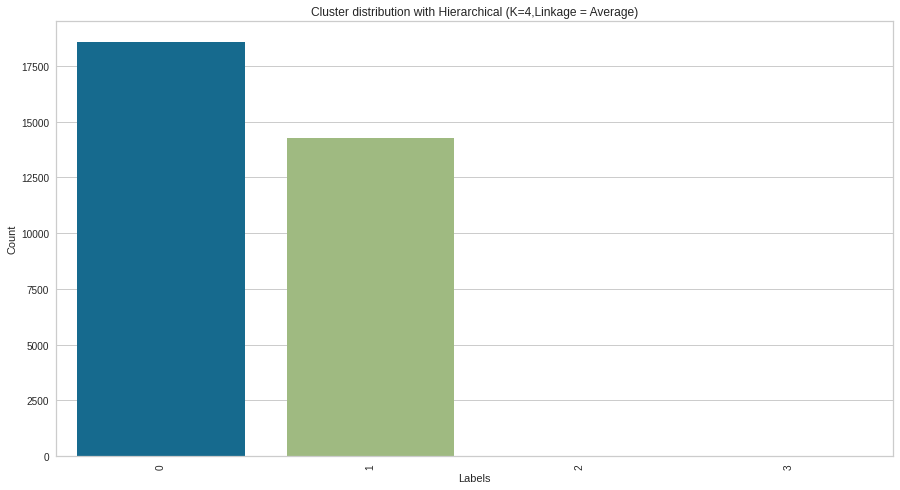

In [ ]:
# barchart for hierarchical with k=4
test=df.copy()
test['Labels']=pipeline_h_4.fit_predict(df[audio_features])
plt.figure(figsize=(15,8))
sns.countplot(test["Labels"])
plt.xticks(rotation = 90)
plt.xlabel("Labels")
plt.ylabel("Count")
plt.title("Cluster distribution with Hierarchical (K=4,Linkage = Average)")

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0.5, 1.0, 'Cluster distribution with Hierarchical (K=24,Linkage = Average)')

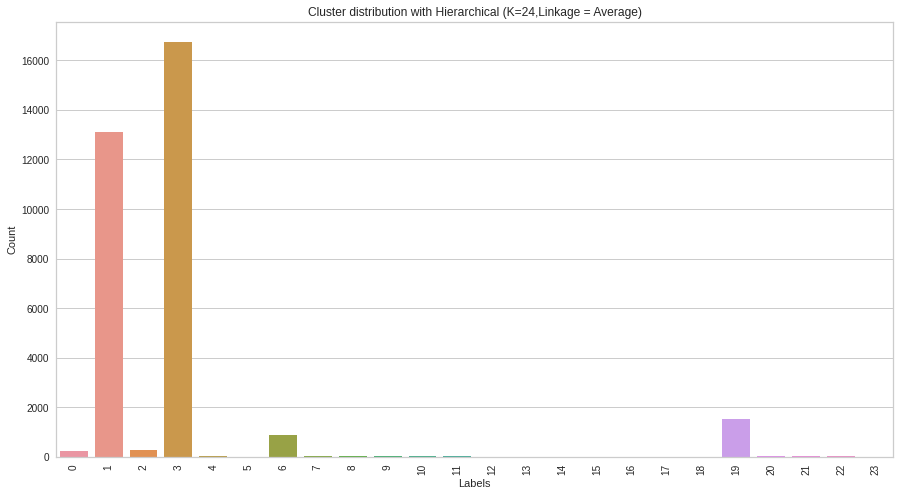

In [ ]:
# barchart for hierarchical with k=24
test=df.copy()
test['Labels']=pipeline_h_24.fit_predict(df[audio_features])
plt.figure(figsize=(15,8))
sns.countplot(test["Labels"])
plt.xticks(rotation = 90)
plt.xlabel("Labels")
plt.ylabel("Count")
plt.title("Cluster distribution with Hierarchical (K=24,Linkage = Average)")

# Final Model 

In [ ]:
# Training model with k=24 using K-means algorithm
kwargs = {
        'init': 'k-means++',
        'n_init': 30,
        'max_iter': 500,
        'random_state': 100
}

#fit pipeline with optimal k
k = 24
pipeline = Pipeline([
                      ('scaler', MinMaxScaler()),
                      ('kmeans', KMeans(n_clusters=k, **kwargs))
  ])  
pipeline.fit(X)

Pipeline(steps=[('scaler', MinMaxScaler()),
                ('kmeans',
                 KMeans(max_iter=500, n_clusters=24, n_init=30,
                        random_state=100))])

# Cluster Validation

In [ ]:
# Creating labels for existing data using final model
test=df.copy()
test['Labels']=pipeline.predict(df[audio_features])

In [ ]:
# number of clusters
test['Labels'].nunique()

24

In [ ]:
#Distribution of clusters
test.groupby('Labels',as_index=False).size()

,Labels,size
0,0,1995
1,1,2860
2,2,1618
3,3,1758
4,4,1881
5,5,1730
6,6,2110
7,7,1048
8,8,719
9,9,681


# Distribution plots for clusters and Manual Validation

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


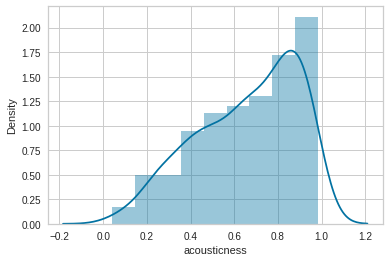

In [ ]:
sns.distplot(test[test['Labels']==10]["acousticness"])

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


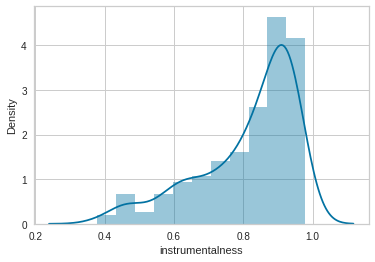

In [ ]:
sns.distplot(test[test['Labels']==10]["instrumentalness"]);

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


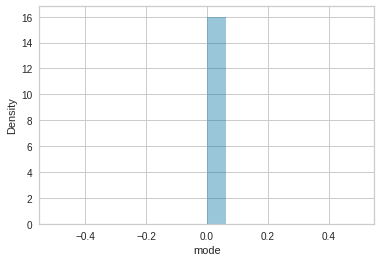

In [ ]:
sns.distplot(test[test['Labels']==10]["mode"])

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


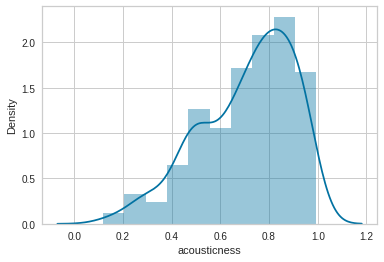

In [ ]:
sns.distplot(test[test['Labels']==16]["acousticness"])

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


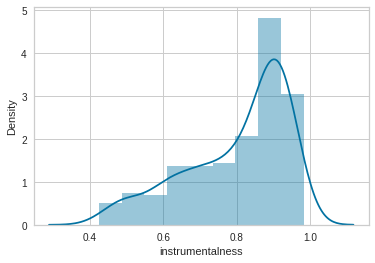

In [ ]:
sns.distplot(test[test['Labels']==16]["instrumentalness"]);

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


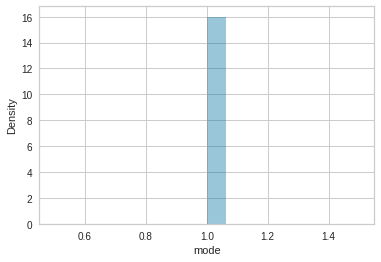

In [ ]:
sns.distplot(test[test['Labels']==16]["mode"]);

In [ ]:
# Cluster with high enrgy and moderate danceability - Roadtrip Songs
test[test['Labels']==3]

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,playlist_subgenre,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,Labels
3,75FpbthrwQmzHlBJLuGdC7,Call You Mine - Keanu Silva Remix,The Chainsmokers,60,1nqYsOef1yKKuGOVchbsk6,Call You Mine - The Remixes,2019-07-19,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.718,0.930,7,-3.778,1,0.1020,0.028700,0.000009,0.2040,0.2770,121.956,169093,3
8,7bF6tCO3gFb8INrEDcjNT5,Tough Love - Tiësto Remix / Radio Edit,Avicii,68,7CvAfGvq4RlIwEbT9o8Iav,Tough Love (Tiësto Remix),2019-06-14,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.594,0.935,8,-3.562,1,0.0565,0.024900,0.000004,0.6370,0.3660,127.015,193187,3
11,3iJeF2izF1QcpCgUc97BLl,Hate Me - R3HAB Remix,Ellie Goulding,67,6e6RVFWdZaoTiLAZOCMnps,Hate Me (R3HAB Remix),2019-08-16,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.437,0.774,8,-4.918,1,0.0554,0.148000,0.000000,0.1330,0.3290,123.125,203733,3
19,2v3DuCVBbopteJqdM7aKQK,Let It Be Me - Sondr Remix,Steve Aoki,35,097kyycr5ZuLS2cPwwUHwt,Let It Be Me (Remixes),2019-10-18,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.467,0.821,7,-5.466,1,0.0934,0.007910,0.000441,0.1310,0.2320,122.676,185366,3
24,4sqABRRGU7CzcHXCyxUzFw,Do You Mean (feat. Ty Dolla $ign & bülow) - My...,The Chainsmokers,58,5vf16sRhXB2f3sS5kteU2T,Do You Mean - The Remixes (feat. Ty Dolla $ign...,2019-05-24,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.620,0.889,11,-3.785,1,0.0352,0.016300,0.000019,0.3950,0.4220,110.018,205093,3
28,4OFFY6L5ywYM1TwhXX69wQ,So Am I - Toby Green Remix,Ava Max,62,4pl2838fY2YPaqiT2yWuMo,So Am I (Toby Green Remix),2019-05-23,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.625,0.938,6,-3.983,1,0.0517,0.004320,0.000260,0.0923,0.3710,127.997,166875,3
30,1aT7vltGhkjyMI3F3aO3A4,Mother - Fedde Le Grand Remix,Charlie Puth,56,2Ryw2kkGP0VecGM9b4kjgo,Mother (Fedde Le Grand Remix),2019-11-01,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.641,0.869,11,-4.754,1,0.0423,0.031900,0.001310,0.4030,0.3580,128.091,178125,3
34,7p4jpmyBnOpqQ3rSGJzZ7w,Quite Miss Home - Steve Void Remix,James Arthur,60,4H87kr1cjR2CSUkTFopYEK,Quite Miss Home (Steve Void Remix),2019-11-22,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.716,0.815,10,-4.121,1,0.0533,0.108000,0.000000,0.1630,0.3510,124.975,220413,3
68,27F9FlipD657qYRQT3qxFm,Treehouse - R3HAB Remix,James Arthur,56,6T3Bfp49DNsclv7kq9eqP2,Treehouse (R3HAB Remix),2019-09-13,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.367,0.783,6,-4.504,1,0.1540,0.005150,0.000000,0.0545,0.2890,88.013,192653,3
75,5PYQUBXc7NYeI1obMKSJK0,Never Really Over,Katy Perry,85,3KjXg0MDej2pG9fv6I22lT,Never Really Over,2019-05-31,Dance Pop,37i9dQZF1DWZQaaqNMbbXa,pop,dance pop,0.770,0.882,8,-4.792,1,0.0602,0.194000,0.000000,0.3160,0.3850,99.991,223523,3


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


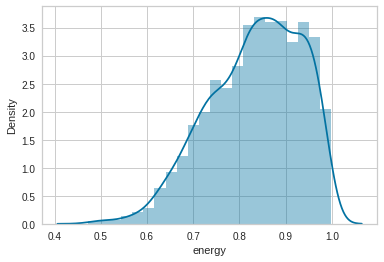

In [ ]:
sns.distplot(test[test['Labels']==3]["energy"])

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


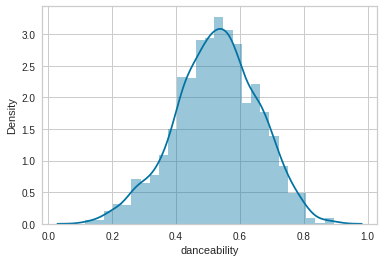

In [ ]:
sns.distplot(test[test['Labels']==3]["danceability"]);

In [ ]:
#CLuster with High danceability and low instrumentalness - Party Songs
test[test['Labels']==1]

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,playlist_subgenre,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,Labels
4,1e8PAfcKUYoKkxPhrHqw4x,Someone You Loved - Future Humans Remix,Lewis Capaldi,69,7m7vv9wlQ4i0LFuJiE2zsQ,Someone You Loved (Future Humans Remix),2019-03-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.650,0.833,1,-4.672,1,0.0359,0.080300,0.000000,0.0833,0.725,123.976,189052,1
9,1IXGILkPm0tOCNeq00kCPa,If I Can't Have You - Gryffin Remix,Shawn Mendes,67,4QxzbfSsVryEQwvPFEV5Iu,If I Can't Have You (Gryffin Remix),2019-06-20,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.642,0.818,2,-4.552,1,0.0320,0.056700,0.000000,0.0919,0.590,124.957,253040,1
12,6e0CvGZf7CouOpYF8toXHC,Body On My,Loud Luxury,67,2R66I0nzp3NnuUlzIGWQ5P,Body On My,2019-03-29,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.744,0.726,1,-4.675,1,0.0463,0.039900,0.000000,0.3740,0.687,121.985,192507,1
15,1EJgymgJHcjSOGSHcYaxvW,South of the Border (feat. Camila Cabello & Ca...,Ed Sheeran,66,1imXAvLuowvPYIsFMYUPY0,South of the Border (feat. Camila Cabello & Ca...,2019-12-11,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.805,0.835,0,-4.603,1,0.0896,0.130000,0.000005,0.3650,0.722,125.028,188230,1
29,1hr5Y2i4NlE3LPvQZ9Q5Ao,When You Leave - Breathe Carolina Remix,Nikki Vianna,30,6MhbDWEsAP9Xsgoj0TuEOc,When You Leave (Breathe Carolina Remix),2019-04-19,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.679,0.909,1,-2.929,1,0.1050,0.033400,0.000000,0.2690,0.819,119.885,155080,1
33,7AasLZ4TYgh7dbJXZxcZVE,Torn - KREAM Remix,Ava Max,60,6gKLNSKPll9DAG5xiygMxD,Torn (KREAM Remix),2019-09-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.742,0.864,0,-5.060,1,0.0976,0.001410,0.004670,0.2410,0.727,125.032,169935,1
35,4sLtguRBis05qfsBgJ1IdN,Love Me Less (feat. Quinn XCII) - Party Pupils...,MAX,55,3E3l9Ae226bVoSwoPNuwWv,Love Me Less (Remixes),2019-06-21,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.748,0.831,1,-5.029,1,0.1150,0.082300,0.000074,0.0757,0.894,128.024,185273,1
43,3yNZ5r3LKfdmjoS3gkhUCT,bad guy (with Justin Bieber),Billie Eilish,83,6lMlX68jJrx67hiCqdiDvW,bad guy (with Justin Bieber),2019-07-11,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.670,0.453,0,-11.265,1,0.2950,0.252000,0.330000,0.1170,0.680,135.055,194840,1
77,5YkmS18BehACOhIIeUqe6l,I Miss Myself (with HRVY),NOTD,71,0G0ho2sdOWIRRAh1PDTVFd,I Miss Myself (with HRVY),2019-05-03,Dance Pop,37i9dQZF1DWZQaaqNMbbXa,pop,dance pop,0.720,0.864,0,-3.249,1,0.2080,0.085600,0.000000,0.1600,0.659,96.048,191612,1
98,1vsQb8n0icvMsFnL9663LM,Need Your Love (with Noah Kahan),Gryffin,70,5CaTHgZaRvb2vCK1mVbCR1,Gravity,2019-10-24,Dance Pop,37i9dQZF1DWZQaaqNMbbXa,pop,dance pop,0.581,0.760,0,-3.962,1,0.0406,0.160000,0.000000,0.1830,0.523,104.099,205787,1


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


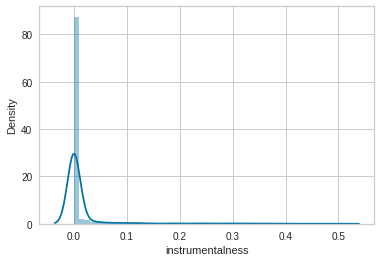

In [ ]:
sns.distplot(test[test['Labels']==1]["instrumentalness"])


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


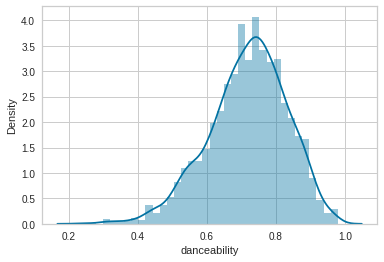

In [ ]:
sns.distplot(test[test['Labels']==1]["danceability"]);

In [ ]:
#Cluster with High Acousticness - Relaxing Songs
test[test['Labels']==19]

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,playlist_subgenre,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,Labels
403,7Bh4dzYrbYtXbbuvK8M8yE,New Shoes - feat.Shun Murakami,phai,21,7Mrelyrb3nTLEmxw3exXX9,New Shoes (feat.Shun Murakami),2020-01-15,Dance Pop: Japan,37i9dQZF1DXahYFr91pFvG,pop,dance pop,0.716,0.46300,9,-7.563,1,0.0337,0.693,0.000296,0.1210,0.3420,92.023,232832,19
711,2b8fOow8UzyDFAE27YhOZM,Memories,Maroon 5,98,3nR9B40hYLKLcR0Eph3Goc,Memories,2019-09-20,Todo Éxitos,2ji5tRQVfnhaX1w9FhmSzk,pop,dance pop,0.764,0.32000,11,-7.209,1,0.0546,0.837,0.000000,0.0822,0.5750,91.019,189486,19
771,6JFyoWiWW69dTjPrJ0RxQ1,When You Wish Upon A Star,The Mamas,55,0RwaotyCpvAytYj5WaH96L,When You Wish Upon A Star,2019-11-08,90s Dance Hits,50cXvxgMGrvoUeLhkzCyIO,pop,dance pop,0.267,0.21000,9,-8.994,1,0.0292,0.825,0.000000,0.1050,0.2880,194.352,183667,19
862,36J64RkkFvdrJNKfiwY0iB,Gravity,Elizabeth Grace,38,0OOBKQWUax70V9bF7gvdDc,Gravity,2018-08-02,Christian Dance Party,37i9dQZF1DWUUPO0Sbx2CM,pop,dance pop,0.722,0.41200,7,-10.864,1,0.0420,0.815,0.000198,0.1630,0.3930,107.070,202710,19
1007,62tXupybKJWVLgWY9TeBxP,Nothin' to Compare,Who,54,72N0ZiJYHZ8BxP9o6MZIn4,Nothin' to Compare,2019-04-12,Pop Dance Hits,7eERKCkgNKCCx5GYdeMIZf,pop,dance pop,0.522,0.52400,10,-10.692,1,0.3130,0.435,0.211000,0.2960,0.1450,115.077,169696,19
1090,5I6y1KWmUoV5YCaIEcs1qs,Should Have Known Better,Sufjan Stevens,65,0U8DeqqKDgIhIiWOdqiQXE,Carrie & Lowell,2015-03-31,Ultimate Indie Presents... Best Indie Tracks o...,37i9dQZF1DWTHM4kX49UKs,pop,dance pop,0.571,0.17200,7,-20.700,1,0.0318,0.979,0.275000,0.1240,0.2970,90.972,307698,19
1097,0ZAhJvqW67Epg4IsLIaSTR,Zebra,Beach House,54,4sYpTER2iT2Y7Kf4VsfUne,Teen Dream,2010-01-26,Ultimate Indie Presents... Best Indie Tracks o...,37i9dQZF1DWTHM4kX49UKs,pop,dance pop,0.612,0.47600,8,-8.256,1,0.0275,0.861,0.004010,0.1470,0.2570,118.383,288720,19
1124,5zOnoB8FdZudDcPX4O8WqF,(No One Knows Me) Like the Piano,Sampha,63,2gUSWVHCOerKhJHZRwhVtN,Process,2017-02-03,Ultimate Indie Presents... Best Indie Tracks o...,37i9dQZF1DWTHM4kX49UKs,pop,dance pop,0.621,0.19900,10,-13.788,1,0.0344,0.976,0.001860,0.1070,0.1780,128.905,218160,19
1141,5iK8GmW2uiPuUc5CtkZrIK,Downtown,Majical Cloudz,53,2xF3ioefFdZrOg9zUBU5hb,Are You Alone?,2015-10-16,Ultimate Indie Presents... Best Indie Tracks o...,37i9dQZF1DWTHM4kX49UKs,pop,dance pop,0.382,0.28300,6,-9.357,1,0.0292,0.786,0.004780,0.1110,0.0441,95.300,249063,19
1160,3oyf4dalm17kzTE8LJDbgR,Lo Que Siento,Cuco,76,04rhYQT6GJgWQQuRE6FfEW,Lo Que Siento,2017-05-25,Ultimate Indie Presents... Best Indie Tracks o...,37i9dQZF1DWTHM4kX49UKs,pop,dance pop,0.326,0.68500,10,-5.576,1,0.1790,0.503,0.000000,0.4270,0.4090,86.882,312000,19


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


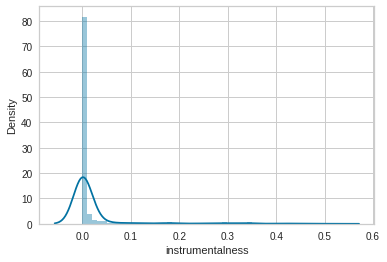

In [ ]:
sns.distplot(test[test['Labels']==19]["instrumentalness"])

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


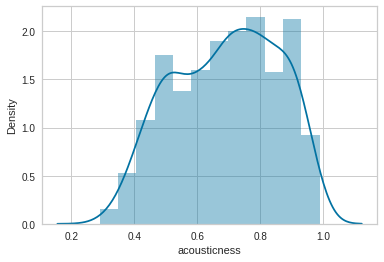

In [ ]:
sns.distplot(test[test['Labels']==19]["acousticness"]);

In [ ]:
#Cluster with High Enrgy songs - Energy Booster Songs
test[test['Labels']==12]

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,playlist_subgenre,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,Labels
202,6pu5jQqenr37n0z6eBKOh0,Dreams Of You (feat. Rae Morris),Icarus,48,26et8vS0ynfWtbIFKKtZi4,Dreams Of You (feat. Rae Morris),2019-10-04,Dance Room,37i9dQZF1DX2ENAPP1Tyed,pop,dance pop,0.570,0.965,6,-4.881,0,0.0348,0.001080,0.523,0.2010,0.14800,123.008,291785,12
350,0AKxkfd5NLlWMXCVgH6a6X,Shades Of Voices (Original Mix),PULLER,2,7aiGXCtPcD85kpHMkLamxg,Shades Of Voices (Original Mix),2017-01-23,Pop Warmup 130 BPM,37i9dQZF1DX3PIAZMcbo2T,pop,dance pop,0.691,0.874,4,-6.276,0,0.0900,0.028600,0.633,0.0704,0.09090,127.990,283193,12
353,4u6chQOq3h6g03cnPzAxcz,Spirit Of Freedom,Dropgun,45,2NYNdxFqVUDLMTNfJAJbcc,Spirit Of Freedom,2019-01-25,Pop Warmup 130 BPM,37i9dQZF1DX3PIAZMcbo2T,pop,dance pop,0.438,0.914,9,-3.919,0,0.0601,0.020600,0.623,0.1200,0.22500,128.184,161250,12
362,45NYp6HaMbhHNtn8sTnztn,Callin' - Extended Mix,Lush & Simon,2,2qYpzBWHF5ueyOzPGejsas,Callin',2018-06-01,Pop Warmup 130 BPM,37i9dQZF1DX3PIAZMcbo2T,pop,dance pop,0.627,0.956,8,-4.498,0,0.0719,0.025600,0.588,0.1250,0.39200,127.984,217500,12
368,1N4n7soiQQ8TRsntrkItyA,Mercury,Catiso,1,1bxLxGgBm9Cy1yhm6n7y67,Mercury,2018-02-23,Pop Warmup 130 BPM,37i9dQZF1DX3PIAZMcbo2T,pop,dance pop,0.732,0.828,6,-5.935,0,0.0535,0.003790,0.797,0.2720,0.22600,128.003,189625,12
502,0PCRR19Pf4iiuvSrPxtQ0x,Sunshine,David Guetta,54,4bTjdxhRRUiWfwj200f9Kl,Nothing but the Beat (Ultimate Edition),2012-12-07,Dance Pop,0B2HdP15IucgE0vk3sluJR,pop,dance pop,0.590,0.800,1,-5.044,0,0.0437,0.000640,0.902,0.0512,0.21900,127.994,360960,12
529,5ypiGNhYY1GUoVB1kVZmc8,Bromance - Avicii Remix,Tim Berg,7,0Aw2fh7MQbvnTiTJjnvHcE,10 Years Armada,2013-11-22,Dance Pop,0B2HdP15IucgE0vk3sluJR,pop,dance pop,0.624,0.903,1,-4.540,0,0.0362,0.032500,0.753,0.0908,0.31200,126.047,150160,12
596,13qqdlSeF8FcxsRyapDMZ0,Changes,Faul & Wad Ad,39,2TQZYFed2I2ajTSzwZV7ag,Changes,2013-11-15,Dance Pop Tunes,4SdfG4cPG3skmTiQLozZGh,pop,dance pop,0.822,0.704,3,-8.242,0,0.0374,0.008640,0.627,0.0633,0.25500,125.999,345173,12
634,430efk5Jc5wGay4EWP4snS,Baianá,Bakermat,76,0ddPcZRUIUj8HvgY3nhaVu,Baianá,2019-11-08,Pop / Dance,6mXh8CUBMBsBUu88a4eAQV,pop,dance pop,0.497,0.755,2,-6.948,0,0.0497,0.000700,0.585,0.3300,0.49300,121.869,182187,12
748,24CXuh2WNpgeSYUOvz14jk,Sandstorm - Radio Edit,Darude,61,3EWyQlR8LFyu6FImQT49bv,Before The Storm,2007-04-18,90s Dance Hits,50cXvxgMGrvoUeLhkzCyIO,pop,dance pop,0.539,0.980,11,-8.180,0,0.0469,0.169000,0.982,0.0840,0.52200,136.087,225373,12


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


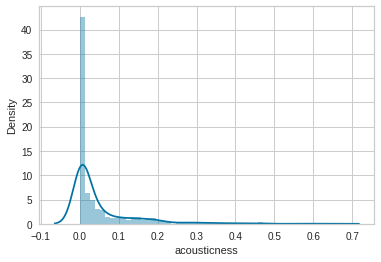

In [ ]:
sns.distplot(test[test['Labels']==12]["acousticness"])

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


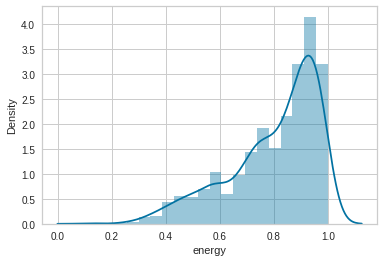

In [ ]:
sns.distplot(test[test['Labels']==12]["energy"]);

## Save model

In [ ]:
from joblib import dump, load

model = pipeline

dump(pipeline, 'song-cluster-model.joblib')

['song-cluster-model.joblib']

In [ ]:
from joblib import dump, load

pipeline = load('song-cluster-model.joblib')

# Spotipy

In [ ]:
#Register app
cid = '48a10dfefb294172a7053a196c799b7a'
secret = '2feb3ec9a9194416b50613cad389d733'
client_credentials_manager = SpotifyClientCredentials(client_id=cid, client_secret=secret)
sp = spotipy.Spotify(client_credentials_manager = client_credentials_manager)

Predict cluster for spotify song link 

In [ ]:

song_id_list = ["https://open.spotify.com/track/3JR0ducCexKbeK47g6AHm5", 
                "https://open.spotify.com/track/3FeVmId7tL5YN8B7R3imoM",
                "https://open.spotify.com/track/1e8PAfcKUYoKkxPhrHqw4x"]
song_df = pd.DataFrame(sp.audio_features(song_id_list))
song_df.head()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,id,uri,track_href,analysis_url,duration_ms,time_signature
0,0.739,0.588,8,-4.971,1,0.1360,0.00308,0,0.1090,0.774,109.958,audio_features,3JR0ducCexKbeK47g6AHm5,spotify:track:3JR0ducCexKbeK47g6AHm5,https://api.spotify.com/v1/tracks/3JR0ducCexKb...,https://api.spotify.com/v1/audio-analysis/3JR0...,164457,4
1,0.588,0.701,9,-6.390,1,0.0402,0.00813,0,0.2000,0.443,104.988,audio_features,3FeVmId7tL5YN8B7R3imoM,spotify:track:3FeVmId7tL5YN8B7R3imoM,https://api.spotify.com/v1/tracks/3FeVmId7tL5Y...,https://api.spotify.com/v1/audio-analysis/3FeV...,228000,4
2,0.650,0.833,1,-4.672,1,0.0359,0.08030,0,0.0833,0.725,123.976,audio_features,1e8PAfcKUYoKkxPhrHqw4x,spotify:track:1e8PAfcKUYoKkxPhrHqw4x,https://api.spotify.com/v1/tracks/1e8PAfcKUYoK...,https://api.spotify.com/v1/audio-analysis/1e8P...,189052,4


In [ ]:
artist = 'BTS'
track = 'Dynamite'
# artist = 'Coldplay'
# track = 'Yellow'

song = sp.search(q="artist:" + artist + " track:" + track, type="track")
song_id = song['tracks']['items'][0]['id']

song_df = pd.DataFrame(sp.audio_features(song_id))
song_df.head()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,id,uri,track_href,analysis_url,duration_ms,time_signature
0,0.746,0.765,6,-4.41,0,0.0993,0.0112,0,0.0936,0.737,114.044,audio_features,5QDLhrAOJJdNAmCTJ8xMyW,spotify:track:5QDLhrAOJJdNAmCTJ8xMyW,https://api.spotify.com/v1/tracks/5QDLhrAOJJdN...,https://api.spotify.com/v1/audio-analysis/5QDL...,199054,4


In [ ]:
type(song)

dict

In [ ]:
#np.arange(0,1,0.001)
np.arange(-46.0, 2.0, 0.01)

array([-46.  , -45.99, -45.98, ...,   1.97,   1.98,   1.99])

In [ ]:
song['tracks']['items'][0]

In [ ]:
song_features_df = song_df[audio_features]
song_features_df

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
0,0.746,0.765,6,-4.41,0,0.0993,0.0112,0,0.0936,0.737,114.044


In [ ]:
tracks_df.head()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
0,0.748,0.916,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036
1,0.726,0.815,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972
2,0.675,0.931,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008
3,0.718,0.930,7,-3.778,1,0.1020,0.0287,0.000009,0.2040,0.277,121.956
4,0.650,0.833,1,-4.672,1,0.0359,0.0803,0.000000,0.0833,0.725,123.976


In [ ]:
df.head(15)

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,6f807x0ima9a1j3VPbc7VN,I Don't Care (with Justin Bieber) - Loud Luxur...,Ed Sheeran,66,2oCs0DGTsRO98Gh5ZSl2Cx,I Don't Care (with Justin Bieber) [Loud Luxury...,2019-06-14,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,6,-2.634,1,0.0583,0.10200,0.000000,0.0653,0.518,122.036,194754
1,0r7CVbZTWZgbTCYdfa2P31,Memories - Dillon Francis Remix,Maroon 5,67,63rPSO264uRjW1X5E6cWv6,Memories (Dillon Francis Remix),2019-12-13,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,11,-4.969,1,0.0373,0.07240,0.004210,0.3570,0.693,99.972,162600
2,1z1Hg7Vb0AhHDiEmnDE79l,All the Time - Don Diablo Remix,Zara Larsson,70,1HoSmj2eLcsrR0vE9gThr4,All the Time (Don Diablo Remix),2019-07-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-3.432,0,0.0742,0.07940,0.000023,0.1100,0.613,124.008,176616
3,75FpbthrwQmzHlBJLuGdC7,Call You Mine - Keanu Silva Remix,The Chainsmokers,60,1nqYsOef1yKKuGOVchbsk6,Call You Mine - The Remixes,2019-07-19,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,7,-3.778,1,0.1020,0.02870,0.000009,0.2040,0.277,121.956,169093
4,1e8PAfcKUYoKkxPhrHqw4x,Someone You Loved - Future Humans Remix,Lewis Capaldi,69,7m7vv9wlQ4i0LFuJiE2zsQ,Someone You Loved (Future Humans Remix),2019-03-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-4.672,1,0.0359,0.08030,0.000000,0.0833,0.725,123.976,189052
5,7fvUMiyapMsRRxr07cU8Ef,Beautiful People (feat. Khalid) - Jack Wins Remix,Ed Sheeran,67,2yiy9cd2QktrNvWC2EUi0k,Beautiful People (feat. Khalid) [Jack Wins Remix],2019-07-11,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,8,-5.385,1,0.1270,0.07990,0.000000,0.1430,0.585,124.982,163049
6,2OAylPUDDfwRGfe0lYqlCQ,Never Really Over - R3HAB Remix,Katy Perry,62,7INHYSeusaFlyrHSNxm8qH,Never Really Over (R3HAB Remix),2019-07-26,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,5,-4.788,0,0.0623,0.18700,0.000000,0.1760,0.152,112.648,187675
7,6b1RNvAcJjQH73eZO4BLAB,Post Malone (feat. RANI) - GATTÜSO Remix,Sam Feldt,69,6703SRPsLkS4bPtMFFJes1,Post Malone (feat. RANI) [GATTÜSO Remix],2019-08-29,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,4,-2.419,0,0.0434,0.03350,0.000005,0.1110,0.367,127.936,207619
8,7bF6tCO3gFb8INrEDcjNT5,Tough Love - Tiësto Remix / Radio Edit,Avicii,68,7CvAfGvq4RlIwEbT9o8Iav,Tough Love (Tiësto Remix),2019-06-14,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,8,-3.562,1,0.0565,0.02490,0.000004,0.6370,0.366,127.015,193187
9,1IXGILkPm0tOCNeq00kCPa,If I Can't Have You - Gryffin Remix,Shawn Mendes,67,4QxzbfSsVryEQwvPFEV5Iu,If I Can't Have You (Gryffin Remix),2019-06-20,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,2,-4.552,1,0.0320,0.05670,0.000000,0.0919,0.590,124.957,253040


In [ ]:
df.iloc[[1]][audio_features]

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
1,0.726,0.815,11,-4.969,1,0.0373,0.0724,0.00421,0.357,0.693,99.972


In [ ]:
np.around(3.99001, decimals=2)

3.99

In [ ]:
closest_index = cdist(np.array(song_features_df), np.array(tracks_df)).argmin()
df.iloc[closest_index]

track_id                           52wF5Pa8fK4KwaGGoYDeDV
track_name                                        Alchemy
track_artist                                 Mick Jenkins
track_popularity                                        0
track_album_id                     3IYUI2UJ1AQ6ocTub4QVK1
track_album_name                                  Wave[s]
track_album_release_date                       2015-08-21
playlist_name               Urban/Trap - Contemporary RAP
playlist_id                        5CK0fshHcik1vWyeCc0zat
playlist_genre                                        r&b
playlist_subgenre                      urban contemporary
danceability                                        0.605
energy                                              0.744
key                                                     6
loudness                                           -4.869
mode                                                    0
speechiness                                        0.0845
acousticness  

In [ ]:
query_cluster = pipeline.predict(song_features_df)
query_cluster

array([3], dtype=int32)

In [ ]:
query_cluster[0]

3

Can use this cluster to retrieve similar songs

In [ ]:
song_features_df

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
0,0.429,0.661,11,-7.227,1,0.0281,0.00239,0.000121,0.234,0.285,173.372


In [ ]:
import scipy

scipy.__version__


'1.4.1'

In [ ]:
def create_playlist(new_song,df, label, threshold = 0.1,N=15):
  song_label=pipeline.predict(new_song)[0]
  cluster_df=df[df['Labels']==song_label]
  song_dist=[]
  for i in range(len(cluster_df)):
    song_dist.append(distance.cdist(np.array(new_song.head(1)), np.array(cluster_df[cluster_df['Labels']==label].loc[:,cluster_df.columns.isin(audio_features)][i:i+1]), 'minkowski',2)[0])
  cluster_df['song_dist']=song_dist
  cluster_df['normal_dist']=MinMaxScaler().fit_transform(cluster_df[['song_dist']])
  playlist=list(cluster_df[cluster_df['normal_dist']<=threshold]['track_name'])
  final_playlist=sample(playlist,N)
  return(final_playlist)

In [ ]:
create_playlist(song_features_df,test, query_cluster[0], 0.2,15)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':


['When Doves Cry - Recorded At Spotify Studios NYC',
 'Only in My Dreams',
 'All The Fucking Time - Acoustic',
 'The Scientist',
 'The Shire (Part 1)',
 'Hold On (feat. Monica & Fred Hammond)',
 'Detune',
 'Back At One',
 'Un Audífono Tú, un Audífono Yo',
 'Abrázame - Versión Acústica',
 'Any Time, Any Place',
 'so sad',
 'We Belong',
 'Los Dioses Ocultos',
 'Back At One']

## Extra

In [ ]:
agg_df = test.groupby("Labels")[audio_features].agg({lambda x: pd.Series.mode(x)[0]}) # lambda x: pd.Series.mode(x)[0]}
agg_df

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
,<lambda>,<lambda>,<lambda>,<lambda>,<lambda>,<lambda>,<lambda>,<lambda>,<lambda>,<lambda>,<lambda>
Labels,,,,,,,,,,,
0,0.598,0.928,11,-6.257,0,0.0317,0.1010,0.000,0.116,0.2360,76.469
1,0.767,0.783,1,-5.697,1,0.0363,0.1220,0.000,0.101,0.7140,120.042
2,0.733,0.711,1,-5.831,0,0.0681,0.0969,0.000,0.120,0.5080,95.977
3,0.496,0.903,8,-8.039,1,0.0354,0.0232,0.000,0.104,0.4750,127.984
4,0.513,0.796,2,-4.209,1,0.0439,0.1220,0.000,0.108,0.3830,171.017
5,0.754,0.630,7,-7.159,1,0.0290,0.1520,0.000,0.111,0.4300,103.952
6,0.608,0.800,4,-6.406,0,0.0431,0.0687,0.000,0.111,0.1500,127.966
7,0.748,0.524,7,-5.599,1,0.0338,0.4140,0.000,0.111,0.5620,95.010


In [ ]:
scaled_aggregates = StandardScaler().fit_transform(agg_df)
scaled_agg_df = pd.DataFrame(scaled_aggregates, index=agg_df.index, columns=agg_df.columns)
scaled_agg_df

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1692: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1692: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  FutureWarning,


,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
,<lambda>,<lambda>,<lambda>,<lambda>,<lambda>,<lambda>,<lambda>,<lambda>,<lambda>,<lambda>,<lambda>
Labels,,,,,,,,,,,
0,-0.871724,1.181512,1.659850,-0.010302,-1.183216,-0.653276,-0.513050,-0.506135,-0.226522,-0.853557,-1.614945
1,1.022069,0.503467,-1.290994,0.206711,0.845154,-0.528498,-0.430138,-0.506135,-0.373456,1.659276,0.300602
2,0.641069,0.166783,-1.290994,0.154783,-1.183216,0.334098,-0.529238,-0.506135,-0.187340,0.576339,-0.757339
3,-2.014723,1.064607,0.774597,-0.700867,0.845154,-0.552911,-0.820219,-0.506135,-0.344069,0.402859,0.649746
4,-1.824223,0.564258,-0.995910,0.783344,0.845154,-0.322343,-0.430138,-0.506135,-0.304887,-0.080782,2.541554
5,0.876393,-0.211986,0.479512,-0.359847,0.845154,-0.726516,-0.311693,-0.506135,-0.275500,0.166296,-0.406744
6,-0.759665,0.582962,-0.405741,-0.068042,-1.183216,-0.344044,-0.640577,-0.506135,-0.275500,-1.305657,0.648955
7,0.809158,-0.707660,0.479512,0.244688,0.845154,-0.596312,0.722732,-0.506135,-0.275500,0.860216,-0.799850
